In [88]:
import os
import scipy.ndimage as ndi
import numpy as np
import xarray as xr
import glob
import datetime
import zipfile
from osgeo import gdal
from rasterio import features
import fiona
import warnings

warnings.filterwarnings("ignore")
#%load_ext lab_black

config = {
    "prep_file_dir": "/Users/mohsen/Desktop/EveryField/Test_Dataset/Iran",
    "prep_tile_id": "STA",
    "prep_base_chunk": "auto",
    "prep_time_chunk": "auto",
    "prep_remove_overlap": True,
    "prep_manual_subset": True,
    "prep_x_start": 0,
    "prep_y_start": 0,
    "prep_step": 2000,
    "prep_cloud_coverage_thresh": 22,
    "prep_load_cloud_mask": False,
    "prep_apply_cloud_mask": False,
    "prep_cloud_mask_thresh": 30,
    "prep_clip_percentile": 1,
    "mask_ndwi_thresh": 0.5,
    "mask_ndvi_max_thresh": 0.5,
    "mask_ndvi_range_thresh": 0.5,
    "shp_out_dir": "/Users/mohsen/Desktop/EveryField/Test_Dataset/ir_out/",
    "shp_file_out_str": "_MASK_Class_3_",
}


def clip_nan(array, percentile):
    """
    clip values above and below a certain percentile of the array
    """
    np.seterr(divide="ignore", invalid="ignore")
    vmax = np.nanpercentile(array, 100 - percentile)
    vmin = np.nanpercentile(array, percentile)
    #    array_clip = ((array.astype("f8") - vmin) / (vmax - vmin)).astype("f4") # xarray docs suggest this saves memory
    array_clip = np.clip((array), a_min=vmin, a_max=vmax)
    return array_clip


def normalize(array):
    """
    normalized numpy array into scale 0.0 - 1.0
    """
    np.seterr(divide="ignore", invalid="ignore")
    return (array - np.nanmin(array)) / (np.nanmax(array) - np.nanmin(array))


def xr_get_zip_info_to_dict(zip_file):
    """
    Expects a list of zipped sentinel tiles and
    an epsg code (which needs to be consistent for all tiles)
    in the format: "EPSG_32614", which can be identified from calling !gdalinfo
    Returns a dictionary consisisting tile information (metadata)
    """

    ### Info from file name
    file_name = zip_file[:-4]
    tile_id = zip_file[-26:-20]
    date_str = zip_file[-19:-11]
    date_obj = datetime.datetime.strptime(date_str, "%Y%m%d")
    platform = zip_file[:3]
    prod_level = zip_file[7:10]

    gdal_info = gdal.Info(zip_file, format="json")

    # set GDAL call for 10m bands in zip tile directory
    gdal_str = gdal_info["metadata"]["SUBDATASETS"]["SUBDATASET_1_NAME"]
    epsg = gdal_str[-10:]
    cloud_coverage = float(gdal_info["metadata"][""]["CLOUD_COVERAGE_ASSESSMENT"])
    nodata_pixel_percentage = float(
        gdal_info["metadata"][""]["NODATA_PIXEL_PERCENTAGE"]
    )

    # Get string for cloud mask image
    # Get contents of zip file as a list
    zip_contents = zipfile.ZipFile(zip_file, "r")
    # path to 20m cloud mask within the zipped file
    cld_path = [s for s in zip_contents.namelist() if "MSK_CLDPRB_20m.jp2" in s]
    # create string to call cloud mask .jp2 from zipped file with rasterio
    cld_mask_str = "/vsizip/" + zip_file + "/" + cld_path[0]

    # return dict of tile info with top level key: file name
    info_dict = {
        file_name: {
            "tile_id": tile_id,
            "date_str": date_str,
            "date_obj": date_obj,
            "gdal_str": gdal_str,
            "epsg": epsg,
            "cloud_coverage": cloud_coverage,
            "nodata_pixel_percentage": nodata_pixel_percentage,
            "platform": platform,
            "product_level": prod_level,
            "cloud_mask_str": cld_mask_str,
        }
    }

    return info_dict


def xr_dict_to_dataset_cloud_mask(
    da_name,
    gdal_str,
    date_obj,
    tile_id,
    cld_mask_str,
    load_cloud_mask=config["prep_load_cloud_mask"],
    apply_cloud_mask=config["prep_apply_cloud_mask"],
    cloud_mask_thresh=config["prep_cloud_coverage_thresh"],
    chunks=(-1, config["prep_step"], config["prep_step"]),
    remove_overlap=config["prep_remove_overlap"],
    manual_subset=config["prep_manual_subset"],
    x_start=config["prep_x_start"],
    y_start=config["prep_x_start"],
    step=config["prep_step"],
):


    # Lazily read file to xarray DataArray
    rio_da = xr.open_rasterio(gdal_str, chunks=chunks)
    # set time coordinate
    rio_da["time"] = date_obj
    # set da name
    rio_da.name = da_name
    # set tile_id
    rio_da.attrs["tile_id"] = tile_id

    if load_cloud_mask:

        # Get cloud mask
        cld_mask_da = xr.open_rasterio(cld_mask_str)
        cld_mask_da["time"] = date_obj
        cld_mask_da.name = "cloud_mask"

        # Resample cloud mask to 10m resolution to work with imagery bands
        new_x = np.linspace(
            (cld_mask_da.x[0].values - 5).astype(int),
            (cld_mask_da.x[-1].values + 5).astype(int),
            len(cld_mask_da.x) * 2,
        )
        new_y = np.linspace(
            (cld_mask_da.y[0].values + 5).astype(int),
            (cld_mask_da.y[-1].values - 5).astype(int),
            len(cld_mask_da.y) * 2,
        )
        cld_mask_da_interp = cld_mask_da.interp(x=new_x, method="nearest")
        cld_mask_da_interp = cld_mask_da_interp.interp(y=new_y, method="nearest")
        base_chunk = chunks[1]
        ### Prep cloud mask data to join with imagery bands
        cld_mask_da_interp = cld_mask_da_interp[0, :, :]
        cld_mask_da_interp = cld_mask_da_interp.chunk(chunks=(base_chunk, base_chunk))
        del cld_mask_da_interp.attrs["transform"]
        del cld_mask_da_interp.attrs["res"]
        del cld_mask_da_interp.attrs["is_tiled"]
        del cld_mask_da_interp.attrs["nodatavals"]
        del cld_mask_da_interp.attrs["scales"]
        del cld_mask_da_interp.attrs["offsets"]
        cld_mask_da_interp = cld_mask_da_interp.drop("band")

    # this removes the area overlapping with the neighboring tile on the right and bottom
    # The overlap is 983 pixels, but using 980 results in a clean 10000 by 10000 pixel tile
    if remove_overlap:
        rio_da = rio_da[:, :-980, :-980]
        if load_cloud_mask:
            cld_mask_da_interp = cld_mask_da_interp[:-980, :-980]

    if manual_subset:
        # Just for processing in manual batches
        x = x_start
        y = y_start
        x_end = x + step
        y_end = y + step
        rio_da = rio_da[:, x:x_end, y:y_end]
        if load_cloud_mask:
            cld_mask_da_interp = cld_mask_da_interp[x:x_end, y:y_end]

    # convert to dataset
    ds = rio_da.to_dataset(dim="band")
    ds = ds.rename_vars({1: "red", 2: "green", 3: "blue", 4: "nir"})

    # Apply cloud mask to bands
    if apply_cloud_mask:
        ds["cloud_mask"] = cld_mask_da_interp.astype(int)
        ds["red"] = ds["red"].where(ds.cloud_mask < cloud_mask_thresh)
        ds["green"] = ds["green"].where(ds.cloud_mask < cloud_mask_thresh)
        ds["blue"] = ds["blue"].where(ds.cloud_mask < cloud_mask_thresh)
        ds["nir"] = ds["nir"].where(ds.cloud_mask < cloud_mask_thresh)

    return ds


def prep_data():
    """
        This function gets parameters like 'tile_id' and 'prep_data_dir' and others to access the zipped sentinel 2 files downloaded from https://scihub.copernicus.eu/dhus/#/home
        prep_data applies preprocessing steps to the raw data and returns a xarray dataset holding all xarray data arrays that have passed the cloud coverage condition named ds_time_stack.

    Notes:
    ToDo 1. I could have used 'sentinelsat' v0.14 module to directly and automatically download sentinel files according to the tile_id and a list of dates.
    ToDo 2. I may pass the config dictionary as props for this function to avoid having a function receiving no props.
    """
    # set variables from global config
    global config
    # file dir
    file_dir = config["prep_file_dir"]
    tile_id = config["prep_tile_id"]
    # chunking
    base_chunk = config["prep_base_chunk"]  # auto
    time_chunk = config["prep_time_chunk"]  # auto
    chunk_size = (time_chunk, base_chunk, base_chunk)
    rechunk_size = {"time": time_chunk, "x": base_chunk, "y": base_chunk}
    # data read parameters
    cloud_coverage_thresh = config["prep_cloud_coverage_thresh"]
    load_cloud_mask = config["prep_load_cloud_mask"]
    apply_cloud_mask = config["prep_apply_cloud_mask"]
    cloud_mask_thresh = config["prep_cloud_mask_thresh"]
    overlap_bool = config["prep_remove_overlap"]
    manual_subset = config["prep_manual_subset"]
    x_start = config["prep_x_start"]
    y_start = config["prep_y_start"]
    step = config["prep_step"]
    percentile = config["prep_clip_percentile"]

    # set working directory to the folder with the sentinel data tiles
    # Set file_dir in the global variables at top of the code
    os.chdir(file_dir)

    # the tile_id for the specific study area is "JKH"
    glob_str = "*" + tile_id + "*.zip"
    zip_list = glob.glob(glob_str)

    # build dictionary of metadata from gdal_info calls for each tile in the list of zip_files
    tile_info_dict = {}

    for zip_str in zip_list:
        tile_info_dict.update(xr_get_zip_info_to_dict(zip_str))

    # date list to hold date objects of time slices in the data stack in order to avoid duplicate dates
    date_list = []
    count_cloud_pass = 0
    count_total_files = 0
    print("Cloud Coverage Threshold:", cloud_coverage_thresh)
    for k, v in tile_info_dict.items():

        if v["cloud_coverage"] < cloud_coverage_thresh:

            # Print tile info
            print(
                "passed cloud coverage:",
                v["date_str"][:4],
                v["date_str"][4:6],
                v["date_str"][6:],
                "with",
                v["cloud_coverage"],
                "pct | nodata pixel pct:",
                v["nodata_pixel_percentage"],
            )
            # if this is the first tile to pass the cloud coverage thresh, define it as ds_time_stack
            if count_cloud_pass == 0:
                global ds_time_stack
                ds_time_stack = xr_dict_to_dataset_cloud_mask(
                    k,
                    v["gdal_str"],
                    v["date_obj"],
                    v["tile_id"],
                    v["cloud_mask_str"],
                    load_cloud_mask=load_cloud_mask,
                    apply_cloud_mask=apply_cloud_mask,
                    cloud_mask_thresh=cloud_mask_thresh,
                    chunks=chunk_size,
                    remove_overlap=overlap_bool,
                    manual_subset=manual_subset,
                    x_start=x_start,
                    y_start=y_start,
                    step=step,
                )

                date_list.append(v["date_obj"])

            # if not the first tile
            if count_cloud_pass > 0:
                # if a tile with the same date is already in the ds_time_stack, then skip this tile because there can't be two tiles with the same time dim
                if v["date_obj"] in date_list:
                    continue
                ds_time_stack = xr.concat(
                    [
                        ds_time_stack,
                        xr_dict_to_dataset_cloud_mask(
                            k,
                            v["gdal_str"],
                            v["date_obj"],
                            v["tile_id"],
                            v["cloud_mask_str"],
                            load_cloud_mask=load_cloud_mask,
                            apply_cloud_mask=apply_cloud_mask,
                            cloud_mask_thresh=cloud_mask_thresh,
                            chunks=chunk_size,
                            remove_overlap=overlap_bool,
                            manual_subset=manual_subset,
                            x_start=x_start,
                            y_start=y_start,
                            step=step,
                        ),
                    ],
                    dim="time",
                )
                date_list.append(v["date_obj"])
            # Add to the count so that subsequent tiles are concatenated with ds_time_stack instead of overwriting it
            count_cloud_pass += 1

        else:
            print(
                "FAILED cloud coverage:",
                v["date_str"][:4],
                v["date_str"][4:6],
                v["date_str"][6:],
                "with ",
                v["cloud_coverage"],
                "pct | nodata pixel pct:",
                v["nodata_pixel_percentage"],
            )
        count_total_files += 1

    print(
        count_cloud_pass,
        "out of",
        count_total_files,
        "time steps passed cloud coverage threshold",
    )
    if count_cloud_pass == 0:
        print("no tiles below cloud threshold")

    # Rechunk the full dataset and sort by time dimension
    ds_time_stack = ds_time_stack.chunk(chunks=rechunk_size).sortby("time")

    # Clip each band in each of the time steps to remove outliers
    # Clip outlier values in each band
    ds_time_stack = ds_time_stack.map(clip_nan, percentile=percentile, keep_attrs=True)

    # Normalize each band
    ds_time_stack = xr.Dataset.chunk(
        ds_time_stack.map(normalize, keep_attrs=True), chunks=rechunk_size
    )

    print("ds_time_stack", ds_time_stack)
    return ds_time_stack


def ndvi_xr(input_ds):
    """
    computes the Normalized Difference Vegetation Index (NDVI)
    """
    np.seterr(divide="ignore", invalid="ignore")
    return (input_ds.nir - input_ds.red) / (input_ds.nir + input_ds.red)


def mask_ndvi_max_and_range(monthly_avg_ndvi_ds, max_thresh=0.3, range_thresh=0.3):
    """
    creates a mask with a logical "or" operation
    """
    return xr.ufuncs.logical_or(
        xr.where(
            monthly_avg_ndvi_ds.max(dim="time", skipna=True)
            - monthly_avg_ndvi_ds.isel(time=0)
            < range_thresh,
            1,
            0,
        ),
        xr.where(monthly_avg_ndvi_ds.max(dim="time", skipna=True) < max_thresh, 1, 0),
    )



def ndwi_xr(input_ds):
    """
    computes the Normalized Difference Water Index (NDWI)
    """
    np.seterr(divide="ignore", invalid="ignore")
    return (input_ds.green - input_ds.nir) / (input_ds.green + input_ds.nir)

def ndvi_2(input_ds):
    """
    computes the Normalized Difference Vegetation Index 2 (NDVI2)
    """
#     (b12-nir)/(b12+nir)
    np.seterr(divide="ignore", invalid="ignore")
    return (input_ds.green - input_ds.nir) / (input_ds.green + input_ds.nir)


def fill_holes(input_array):
    """
    Fills the holes in the inputting binary array. A zero surrounded by ones is gonna be converted to one.
    This will get passed to dask arrays within the dataset through dask.map_overlap() for parallelization
    """
    return ndi.binary_fill_holes(input_array)


def min_filter(input_array, size=(2, 2)):
    """
    calculates a multidimensional minimum filter and returns an array passed the minimum filter with the same shape as input.
    parameter size is the passing footprint which is equivalent to np.ones((2,2)).
    This will get passed to dask arrays within the dataset through dask.map_overlap() for parallelization
    """
    return ndi.minimum_filter(input_array, size=size)


def mask_processing(input_ds):
    """
    This step is actually the main step in this project.
    This function creates a final binary mask that has the final field pixels as 1 and the non-field pixels as 0.
    The function receives a time serie of xarray data arrays as an xarray dataset and measures the spectral (vegetation) indices and masks out pixels that meet the threshold conditions set in the config dictionary.

    """
    print("-------Mask Processing-------")
    global config
    base_chunk = config["prep_base_chunk"]  # auto
    ndwi_thresh = config["mask_ndwi_thresh"]  # 0.5
    ndvi_max_thresh = config["mask_ndvi_max_thresh"]  # 0.5
    ndvi_range_thresh = config["mask_ndvi_range_thresh"]  # 0.5

    ### NDWI mask: mean NDWI across all time steps, masked for values greater than ndwi_thresh
    mask = xr.where(
        ndwi_xr(input_ds).mean(dim="time", skipna=True) > ndwi_thresh, 1, 0
    )  # if true 1, otherwise 0.
    
    

    ### NDVI Masking
    ### combining NDVI mask with NDWI mask via logic or operation
    mask = xr.ufuncs.logical_or(
        mask,
        mask_ndvi_max_and_range(
            ndvi_xr(input_ds.resample(time="1MS").mean(skipna=True)),
            max_thresh=ndvi_max_thresh,
            range_thresh=ndvi_range_thresh,
        ),
    )

    # Invert mask
    mask = xr.where(mask == 1, 0, 1)

    ### Fill holes in the mask so that there aren't stray pixels
    mask = mask.data.map_overlap(fill_holes, depth=1)

    ### Set minimum filter to enforce minimum height/width of background.
    ### This eliminates small isolated areas and expands road areas.
    mask = mask.map_overlap(min_filter, depth=1)

    mask = xr.DataArray(
        mask,
        dims=("y", "x"),
        coords=[input_ds["red"].coords["y"], input_ds["red"].coords["x"]],
    ).chunk({"x": base_chunk, "y": base_chunk})

    return mask




    ## Data read parameters
step = config["prep_step"]
print("step----------------> ", step)

        
config["prep_x_start"] = 4000
config["prep_y_start"] = 8000
# print("prep_x_start= ", i, ", prep_y_start= ", j)

#         main()


### Prep data
ds_time_stack = prep_data()

### Process mask
mask = mask_processing(ds_time_stack)

### Writing the created dataArray to shapefile
mask
# write_shapefile(ds_time_stack, mask)





step---------------->  2000
Cloud Coverage Threshold: 22
passed cloud coverage: 2020 03 11 with 21.129048 pct | nodata pixel pct: 0.0
passed cloud coverage: 2020 08 18 with 0.785379 pct | nodata pixel pct: 0.0
passed cloud coverage: 2020 05 15 with 0.45283499999999993 pct | nodata pixel pct: 1.3e-05
FAILED cloud coverage: 2020 11 06 with  27.514565999999995 pct | nodata pixel pct: 0.0
passed cloud coverage: 2020 09 17 with 2.708525 pct | nodata pixel pct: 0.0
passed cloud coverage: 2020 06 19 with 0.071486 pct | nodata pixel pct: 7e-06
passed cloud coverage: 2020 07 19 with 0.334896 pct | nodata pixel pct: 0.0
passed cloud coverage: 2020 04 15 with 1.880352 pct | nodata pixel pct: 7e-06
passed cloud coverage: 2020 10 22 with 0.024506 pct | nodata pixel pct: 3e-06
8 out of 9 time steps passed cloud coverage threshold
ds_time_stack <xarray.Dataset>
Dimensions:  (time: 8, x: 2000, y: 2000)
Coordinates:
  * y        (y) float64 4.06e+06 4.06e+06 4.06e+06 ... 4.04e+06 4.04e+06
  * x        

<xarray.DataArray '_trim-36f4fb66d280213f0d1c14e1e501c941' (y: 2000, x: 2000)>
dask.array<rechunk-merge, shape=(2000, 2000), dtype=bool, chunksize=(2000, 2000), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 4.06e+06 4.06e+06 4.06e+06 ... 4.04e+06 4.04e+06
  * x        (x) float64 2.8e+05 2.8e+05 2.8e+05 2.8e+05 ... 3e+05 3e+05 3e+05

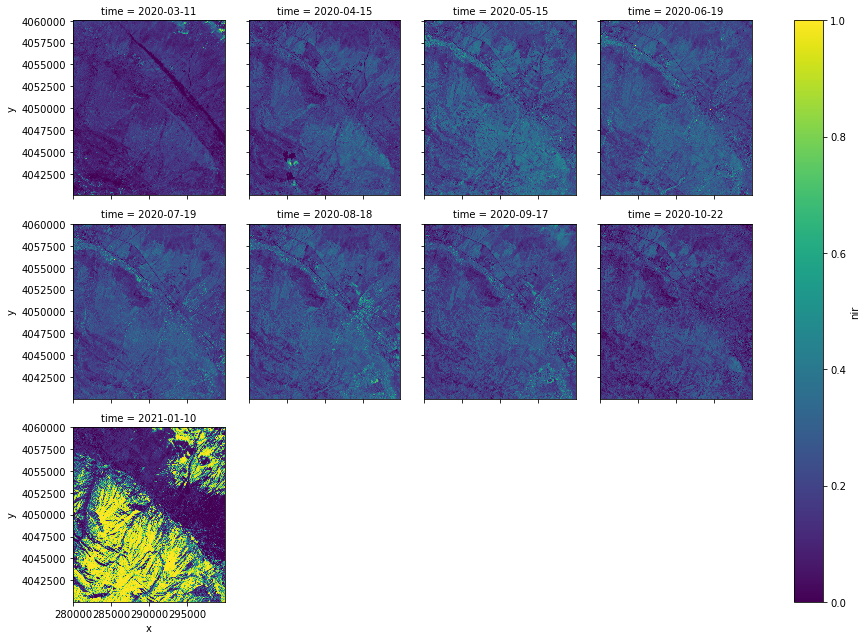

In [87]:
# maskmmm = xr.where((ds.nir.isel(time=4).values>0.4) & 
#                    (ds.nir.isel(time=5).values>0.4) & 
#                    (ds.nir.isel(time=6).values>0.4)
                   
#                    , 0, ndvi_summer_mean.values)
# xr.DataArray(maskmmm).plot(figsize=(20, 10))



fg = ds_time_stack.nir.plot(
    col="time",
    col_wrap=4,  # each row has a maximum of 4 columns
)

### Wheat: 

- Oct  -->  Bare land -- Seeding
- Nov              -->  Bare land
- Dec              -->  Bare land
- Jan              -->  Bare land
- Feb              -->  Bare land
- Mar              -->  Bare land
- Apr  --> Green
- May --> Green
- Jun 22 --> Partially Yellow (getting ready to harvest)
- Jul --> Yellow (Dry)
- Aug  --> Harvesting season starts
- Sep  --> Bare land

### Bean: 

- May   -->  Seeding
- Jun 22           -->  Green
- Jul              -->  Green 
- Aug              -->  Green 
- Sep 10 to 22     -->  Yellow (getting ready to harvest)
- Sep 22 to 31st   -->  Harvesting season
- Oct 22           -->  Bare land
- Nov              -->  Bare land 
- Dec              -->  Bare land
- Jan              -->  Bare land
- Feb              -->  Bare land
- Mar              -->  Bare land
- Apr              -->  Bare land


# Rules: 
* 

In [89]:
# Calculate NDVI dataset
input_ds = ds_time_stack
    
np.seterr(divide="ignore", invalid="ignore")
ndvi = (input_ds.nir - input_ds.red) / (input_ds.nir + input_ds.red) #Maybe try NDVI2 too in the future
ndwi = (input_ds.green - input_ds.nir) / (input_ds.green + input_ds.nir)
# Calculate std and var of NDVI over time as new dataArrays
ndvi_std = ndvi.std(dim="time", skipna = False)
ndvi_std = ndvi_std.fillna(0)
ndvi_var = ndvi.var(dim="time", skipna=True)


ndvi_spatial_mean_monthly = ndvi.mean(dim=("x","y"), skipna=True)
ndvi_spatial_std_monthly = ndvi.std(dim=("x","y"), skipna=True)



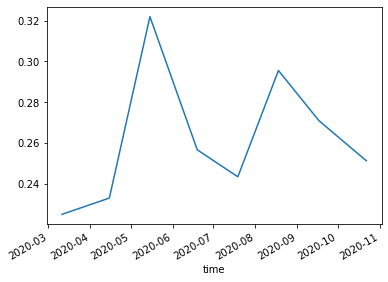

In [90]:
# Before
ndvi_spatial_std_monthly.plot()



               Average NDVI


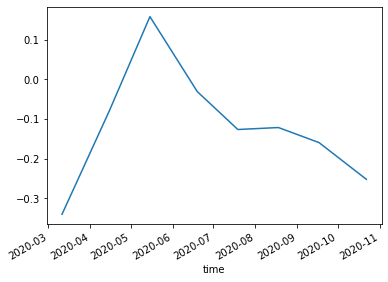

In [91]:
print('\n\n               Average NDVI')
ndvi_spatial_mean_monthly.plot()

In [94]:
# ds_time_stack.nir.isel(time=1).plot()

ndvi_summer_mean = ndvi.isel(time=[1,2,3,4,5]).mean(dim= 'time', skipna = False)

ndvi_winter_mean = ndvi.isel(time=[0,6,7]).mean(dim= 'time' , skipna = False)


# ndvi_summer_mean
# diff = ndvi_summer_mean - ndvi_winter_mean
# print(np.nanmax(diff.values))

# xr.DataArray(diff).plot(figsize=(20, 10))


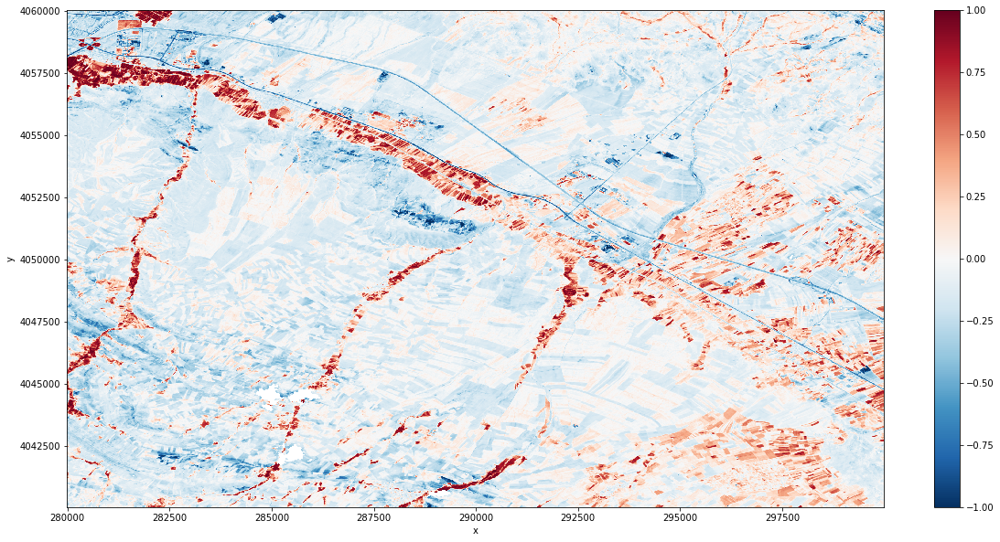

In [96]:
xr.DataArray(ndvi_summer_mean).plot(figsize=(20, 10))



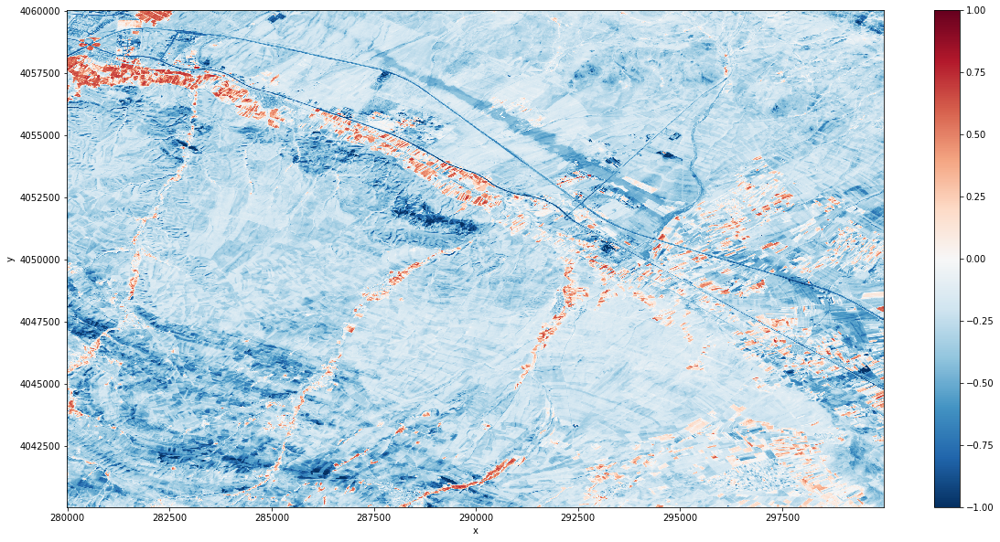

In [97]:
xr.DataArray(ndvi_winter_mean).plot(figsize=(20, 10))

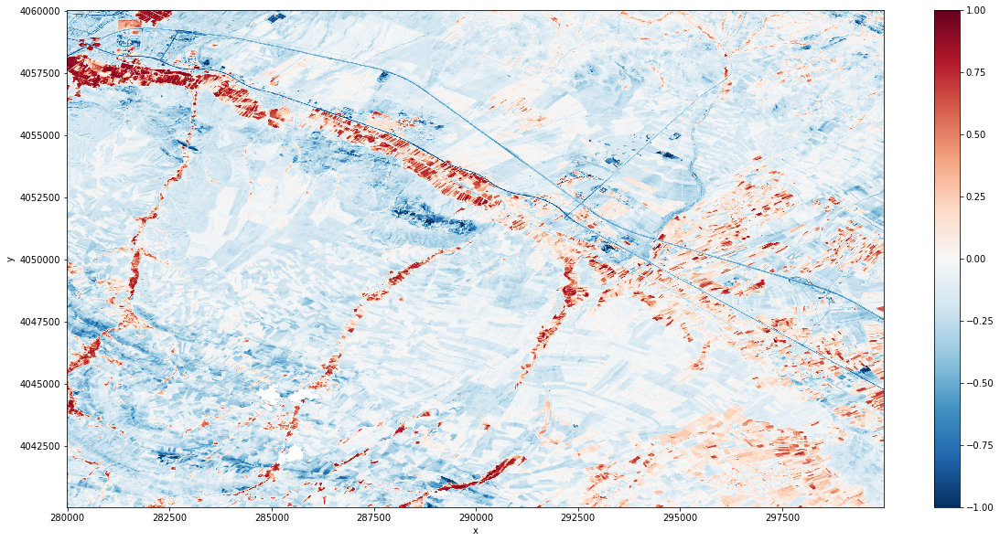

In [100]:
def normalize(array, a, b):
    """
    normalized numpy array into scale [a,b]
    """
    np.seterr(divide="ignore", invalid="ignore")
    return (b-a)*((array - np.nanmin(array)) / (np.nanmax(array) - np.nanmin(array))) + a

normalized_sum = normalize(ndvi_winter_mean+3*ndvi_summer_mean, -1, 1)


xr.DataArray(normalized_sum).plot(figsize=(20, 10))

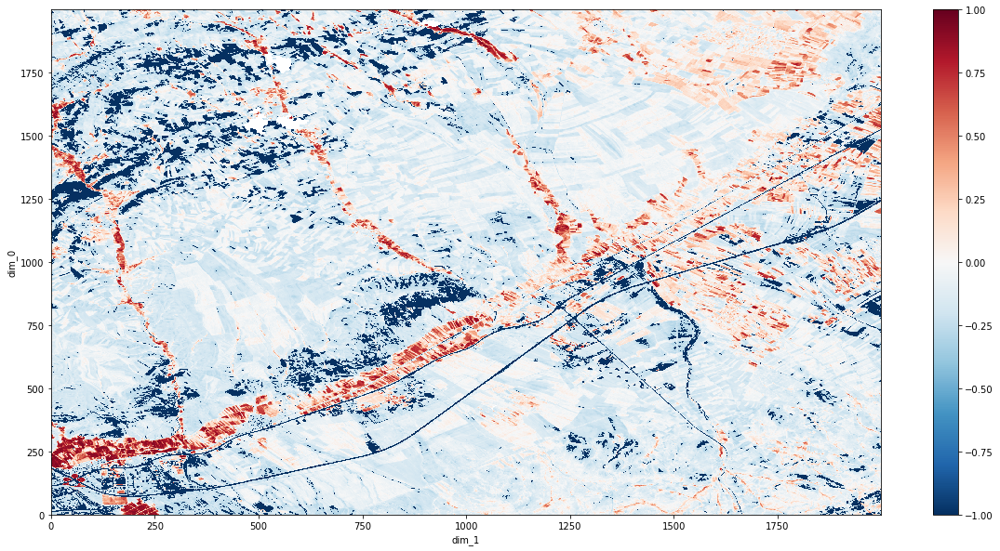

In [154]:

normalized_sum_filtered = xr.where(normalized_sum.values<-0.3, -1, normalized_sum.values)

xr.DataArray(normalized_sum_filtered).plot(figsize=(20, 10))

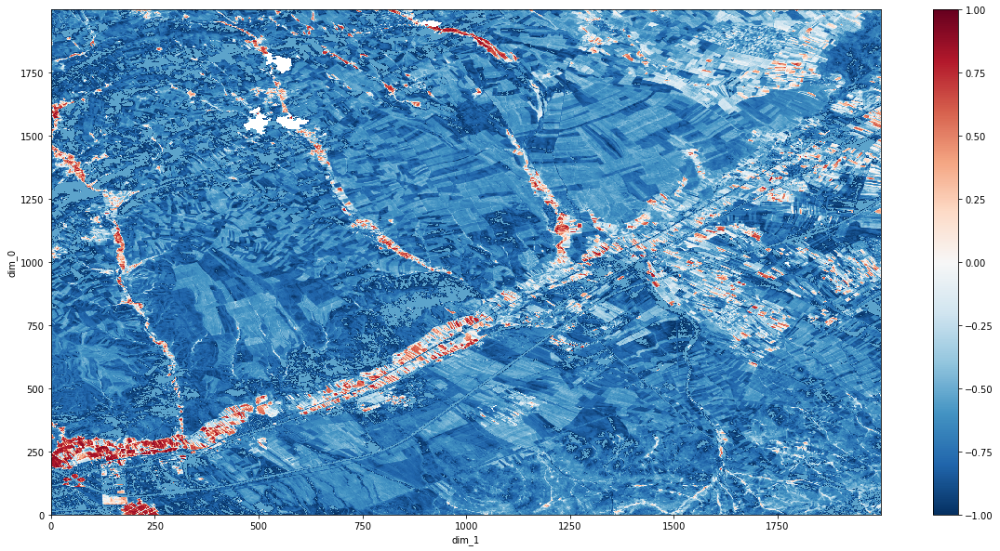

In [105]:
re_norm = normalize(normalized_sum_filtered, -1, 1)
# normalized_sum_filtered = xr.where(normalized_sum.values<0, 0, normalized_sum.values)

xr.DataArray(re_norm).plot(figsize=(20, 10))

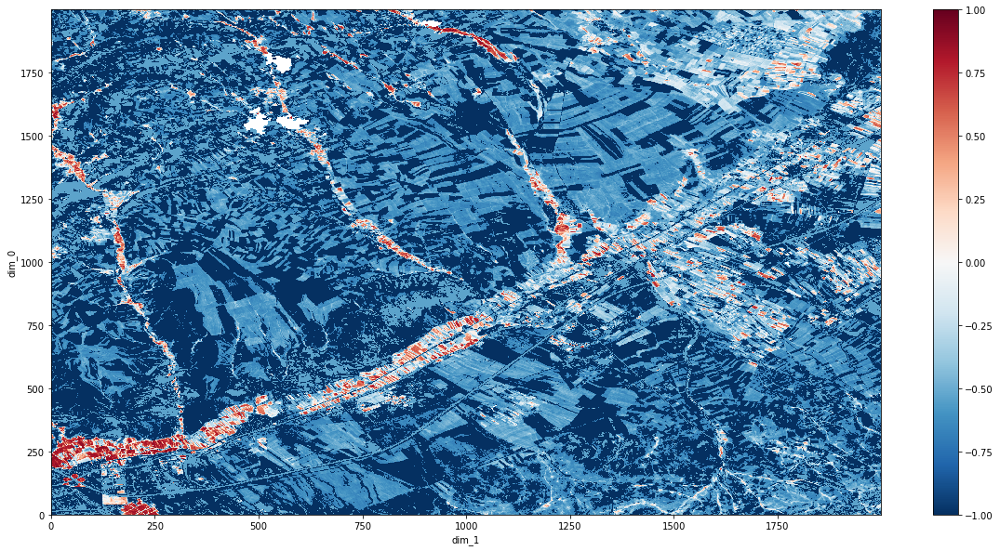

In [125]:
# re_norm = normalize(normalized_sum_filtered, -1, 1)
ndvi_summation = xr.where(re_norm<-0.7, -1, re_norm)

xr.DataArray(ndvi_summation).plot(figsize=(20, 10))

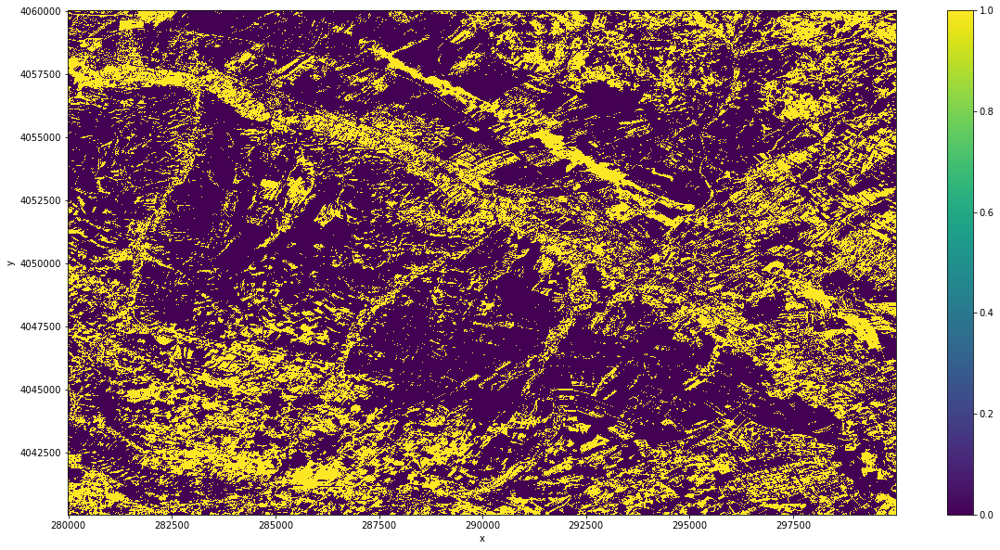

In [153]:

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm



norm_ndvi_std = normalize(ndvi_std, 0, 1)

# class_bins = [0.2, 0.4, 0.6, 0.8]
class_bins = [0.2, 0.4, 0.5]

#0-0.2 -> 0
#0.8-1->4

#-np.inf

reclass_ndvi_std = xr.apply_ufunc(np.digitize, norm_ndvi_std, class_bins, dask = 'allowed')
# f, ax = plt.subplots(figsize=(20, 10))

# im = reclass_ndvi.plot.imshow()
# ax.set_axis_off()

# 0.2 < x < 0.4
mask1_std = xr.where(reclass_ndvi_std==1, 1, 0)
mask1.plot(figsize=(20, 10))

#  x < 0.2
mask0_std = xr.where(reclass_ndvi_std==0, 1, 0)
# mask0.plot(figsize=(20, 10))



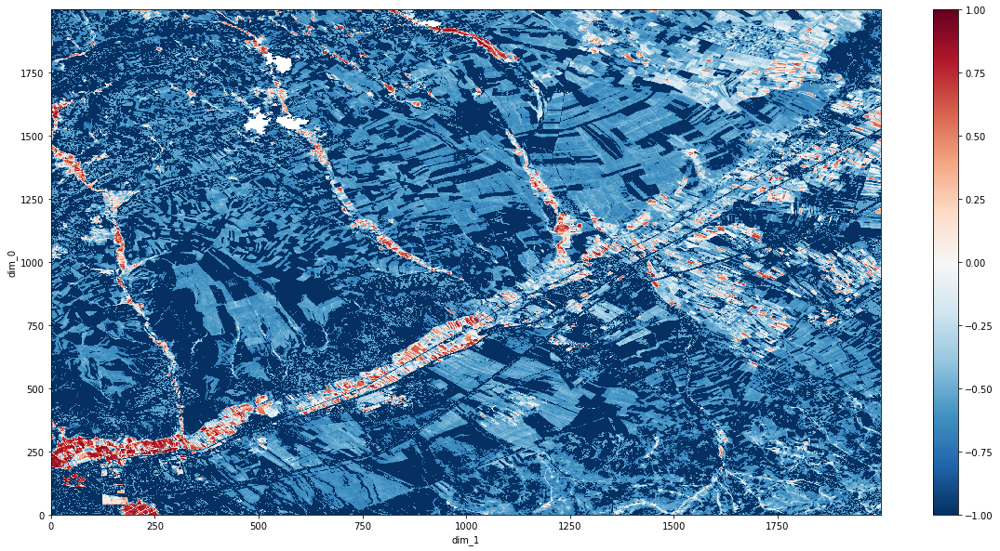

In [127]:
# renorm2 = xr.where(re_norm<-0.7, 0, mask1)

mean_ndwi = ndwi.isel(time = [0,1,2,3,4,5,6,7]).mean(dim='time', skipna = False)
water_removed = xr.where(mean_ndwi.values > 0.4, -1, ndvi_summation)
xr.DataArray(water_removed).plot(figsize=(20, 10))

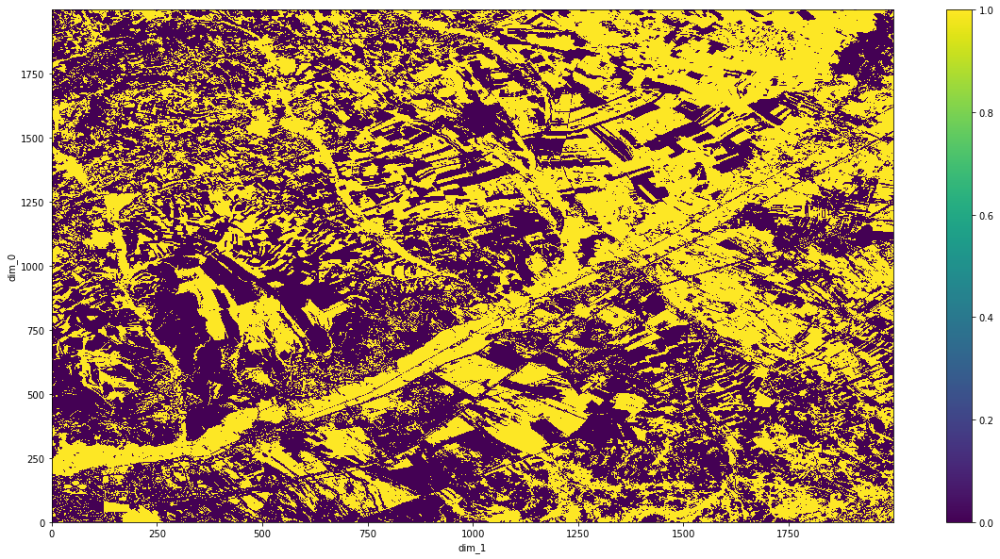

In [147]:

# maskmmm = xr.where((ds.nir.isel(time=4).values>0.4) & 
#                    (ds.nir.isel(time=5).values>0.4) & 
#                    (ds.nir.isel(time=6).values>0.4)
                   
#                    , 0, mask1.values)
normalized_water_removed = normalize(water_removed, -1, 1)
final_mean_mask = xr.where(normalized_water_removed < -0.65, 0, 1)
# final_mask1_std = xr.where(reclass_ndvi_std==1, 1, final_mean)
xr.DataArray(final_mean_mask).plot(figsize=(20, 10))






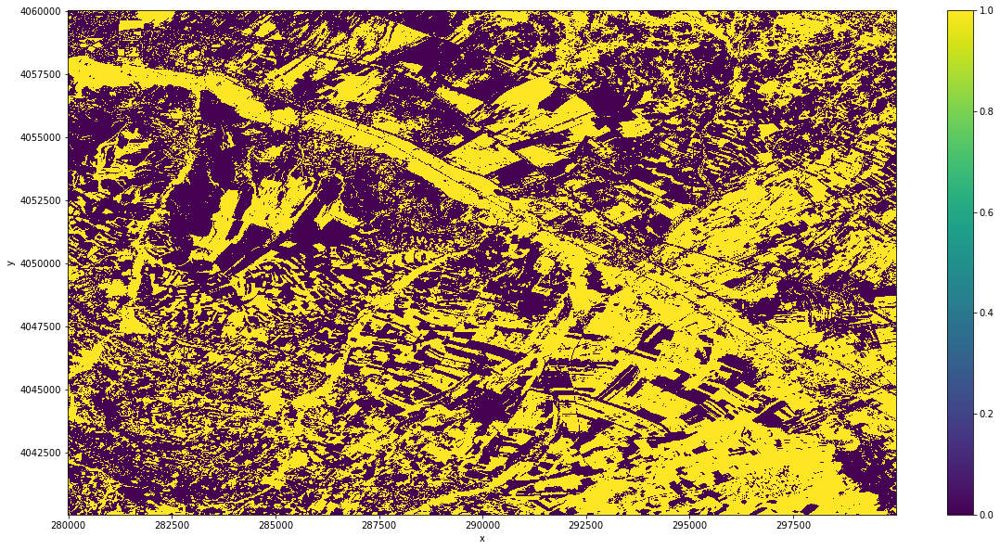

In [150]:
final_mask1_std = xr.where(reclass_ndvi_std==1, 1, 0)
common = final_mean_mask *final_mask1_std
std_mean_mask = common + final_mean_mask
std_mean_mask = xr.where(std_mean_mask>0, 1, 0)

xr.DataArray(std_mean_mask).plot(figsize=(20, 10))


In [151]:

print("-------Writing to Shapefile-------")
tile_id = config["prep_tile_id"]
out_dir = config["shp_out_dir"]
# file_out_str = config["shp_file_out_str"]
file_out_str = 'std_mean_together'
manual_subset = config["prep_manual_subset"]
x_start = config["prep_x_start"]
y_start = config["prep_y_start"]

### Save to shapefile
# set file paths for output
out_file_name = tile_id + file_out_str + ".shp"
output_str = out_dir + out_file_name


# set parameters for spatial projection and mask
# transform = (10.0, 0.0, 279985.0, 0.0, -10.0, 4020035.0)

transform = ds_time_stack.attrs["transform"]
if manual_subset:
    transform_update = (
        ds_time_stack.attrs["transform"][0],
        ds_time_stack.attrs["transform"][1],
        ds_time_stack.coords["x"].values[0],
        ds_time_stack.attrs["transform"][3],
        ds_time_stack.attrs["transform"][4],
        ds_time_stack.coords["y"].values[0],
    )
    transform = transform_update


    # Update outfile name to reflect spatial subset
    out_file_name = (
        tile_id
        + file_out_str
        + "_x"
        + str(x_start)
        + "_y"
        + str(y_start)
        + "_step"
        + str(config["prep_step"])
        + ".shp"
    )
    output_str = out_dir + out_file_name

# CRS from main data stack attributes
crs = '+init=epsg:32639'
# crs = +init=epsg:32639
# Define mask and set type to bool as required for shapefile writing to work
# mask = mask3.fillna(value=0).astype(bool)
# mask = mask1.astype(bool)
# mask = after_water.astype(bool)
# mask = final_mask.astype(bool)
std_mean_mask = np.array(std_mean_mask)
mask = std_mean_mask.astype(bool)
# mask = mask.values
# polygonize input raster to GeoJSON-like dictionary with rasterio.features.shapes


import rasterio
from rasterio.features import shapes
# mask = out_raster
with rasterio.Env():
    with reclass_ndvi as src:
        im = reclass_ndvi.values
        image = im # first band
        results = (
        {'properties': {'raster_val': v}, 'geometry': s}
        for i, (s, v) 
        in enumerate(
            shapes(image.astype("int16"), mask=mask, transform=transform,connectivity=8)))
geoms = list(results)

schema_template = {"geometry": "Polygon", "properties": {"raster_val": "int"}}

# src_crs is the coordinate reference system from the source raster that holds the spatial metadata
with fiona.open(
    output_str, "w", driver="Shapefile", schema=schema_template, crs=crs
) as layer:
    # loop through the list of raster polygons and write to the shapefile
    for geom in geoms:
        layer.write(geom)

transform

-------Writing to Shapefile-------


(10.0, 0.0, 279985.0, 0.0, -10.0, 4060035.0)

In [ ]:
(ds.nir.isel(time=4).values>0.4) & (ds.nir.isel(time=5).values>0.4) & (ds.nir.isel(time=6).values>0.4)& (ds.nir.isel(time=7).values>0.4)








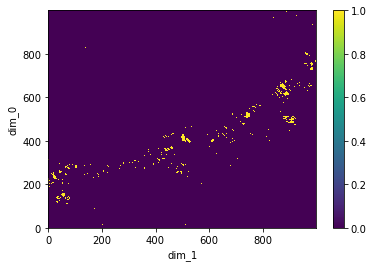

In [109]:
import numpy as np 
from matplotlib import pyplot as plt 

abb = xr.DataArray(maskmmm)
abb.plot()

from sklearn.datasets import make_moons

xx, ll = make_moons(n_samples = 200, noise= 0.1)
b = make_moons(n_samples = 200, noise= 0.01)



model2 = DBSCAN(eps=0.1, min_samples=2, metric='euclidean')

dbscan_model = model2.fit(xx)

lb = dbscan_model.labels_


fig, ax = plt.subplots()
ax.scatter(xx[:,0], xx[:,1], c = dbscan_model.labels_)
fig.show()
dbscan_model.labels_.max()




import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from sklearn.cluster import DBSCAN

class_bins = [0.2]

norm_ndvi_std = normalize(ndvi_std)
bi_ndvi = xr.apply_ufunc(np.digitize, norm_ndvi_std, class_bins, dask = 'allowed')
# f, ax = plt.subplots(figsize=(20, 10))

im = bi_ndvi.plot.imshow()
# ax.set_axis_off()
std_arr = np.array(bi_ndvi)
# tup = (np.array([bi_ndvi.x.values,bi_ndvi.y.values]).transpose(), bi_ndvi.values)
# tup[0]
# tup_re = tup[0].reshape(-1, 2)


yx_coords = np.column_stack(np.where(std_arr >= 0))

# get coordinates (x,y)
xy_coords = np.flip(np.column_stack(np.where(std_arr >= 0)), axis=1)


vals = std_arr.reshape(-1, 1)



model = DBSCAN(eps=1000, min_samples=4, metric='euclidean', algorithm ='auto')

dbscan_model = model.fit(xy_coords)

lb = dbscan_model.labels_


fig, ax = plt.subplots()
ax.scatter(xy_coords[:,0], xy_coords[:,1], c = vals[:,0])
fig.show()
dbscan_model.labels_.max()


std_arr = np.array(bi_ndvi)

yx_coords = np.column_stack(np.where(std_arr >= 0))

# get coordinates (x,y)
xy_coords = np.flip(np.column_stack(np.where(std_arr >= 0)), axis=1)


vals = std_arr.reshape(-1, 1)



In [15]:
lb.shape

(2500,)

In [220]:
std_arr = bi_ndvi.values

In [222]:
vals = std_arr.reshape(-1, 1)
vals.shape

(4000000, 1)

In [216]:
bi_ndvi.x

<xarray.DataArray (y: 2000, x: 2000)>
dask.array<digitize, shape=(2000, 2000), dtype=int64, chunksize=(1000, 1000), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 4.06e+06 4.06e+06 4.06e+06 ... 4.04e+06 4.04e+06
  * x        (x) float64 2.8e+05 2.8e+05 2.8e+05 2.8e+05 ... 3e+05 3e+05 3e+05

import cv2
import numpy as np

# create red image
img = np.full((10,10,3), (0,0,255), dtype=np.uint8)

# convert to grayscale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# get coordinates (y,x) --- alternately see below for (x,y)
yx_coords = np.column_stack(np.where(gray >= 0))
print (yx_coords)

print ('')

# get coordinates (x,y)
xy_coords = np.flip(np.column_stack(np.where(gray >= 0)), axis=1)
print (xy_coords)

from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons

import matplotlib.pyplot as plt
# DBSCAN(eps=0.5, *, min_samples=5, metric='manhattan', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)
class_bins = [0.2]

norm_ndvi_std = normalize(ndvi_std)
bi_ndvi = xr.apply_ufunc(np.digitize, norm_ndvi_std, class_bins, dask = 'allowed')
f, ax = plt.subplots(figsize=(20, 10))

im = bi_ndvi.plot.imshow()
ax.set_axis_off()
std_arr = np.array(bi_ndvi)

model = DBSCAN(eps=30, min_samples=5, metric='manhattan')

dbscan_model = model.fit(ndvi_std.values)

lb = dbscan_model.labels_

yx_coords = np.column_stack(np.where(std_arr >= 0))

# get coordinates (x,y)
xy_coords = np.flip(np.column_stack(np.where(std_arr >= 0)), axis=1)


vals = std_arr.reshape(-1, 1)




fig, ax = plt.subplots()
ax.scatter(xy_coords[:,0], xy_coords[:,1], c = vals)
fig.show()
dbscan_model.labels_.max()
# aax0.title.set_text('Original')
# aax0.imshow(lb)
# plt.show(lb)
# plt.plot(lb)


import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

img= cv2.imread('your image') 
labimg = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

n = 0
while(n<4):
    labimg = cv2.pyrDown(labimg)
    n = n+1

feature_image=np.reshape(labimg, [-1, 3])
rows, cols, chs = labimg.shape

db = DBSCAN(eps=5, min_samples=50, metric = 'euclidean',algorithm ='auto')
db.fit(feature_image)
labels = db.labels_

indices = np.dstack(np.indices(labimg.shape[:2]))
xycolors = np.concatenate((labimg, indices), axis=-1) 
feature_image2 = np.reshape(xycolors, [-1,5])
db.fit(feature_image2)
labels2 = db.labels_

plt.figure(2)
plt.subplot(2, 1, 1)
plt.imshow(img)
plt.axis('off')

# plt.subplot(2, 1, 2)
# plt.imshow(np.reshape(labels, [rows, cols]))
# plt.axis('off')

plt.subplot(2, 1, 2)
plt.imshow(np.reshape(labels2, [rows, cols]))
plt.axis('off')
plt.show()

In [145]:
type(tup[0])

numpy.ndarray

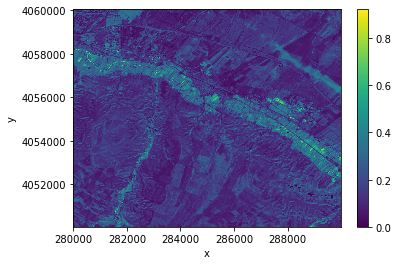

In [7]:
ndvi_std.plot()

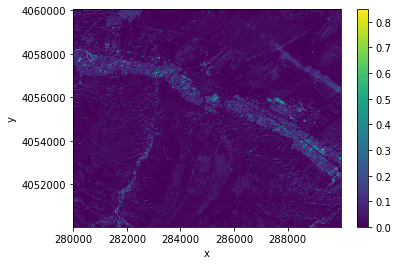

In [8]:
ndvi_var.plot()

In [70]:
def normalize(array):
    """
    normalized numpy array into scale 0.0 - 1.0
    """
    np.seterr(divide="ignore", invalid="ignore")
    return (array - np.nanmin(array)) / (np.nanmax(array) - np.nanmin(array))

norm_ndvi_std = normalize(ndvi_std)

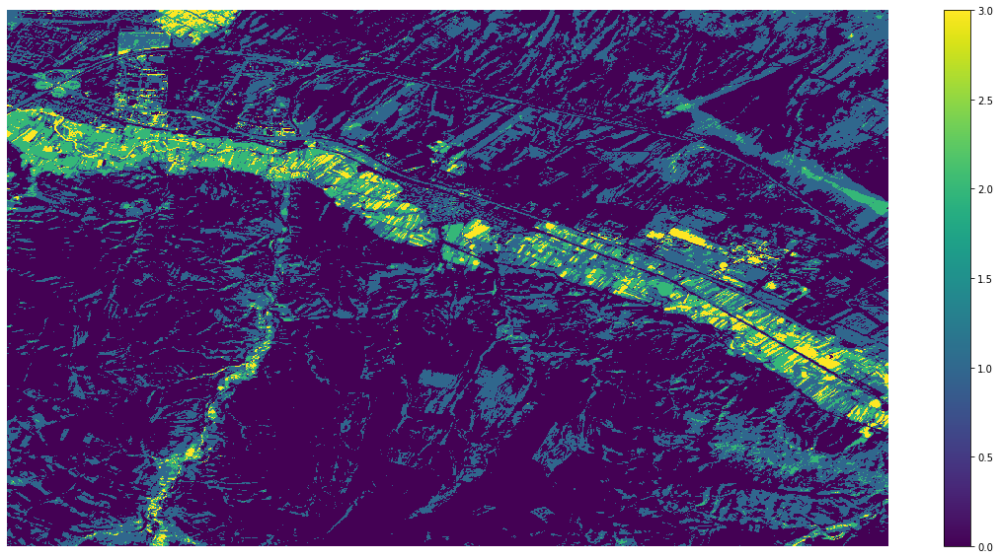

In [71]:

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm


# class_bins = [0.2, 0.4, 0.6, 0.8]
class_bins = [0.2, 0.4, 0.5]

#0-0.2 -> 0
#0.8-1->4

#-np.inf

reclass_ndvi = xr.apply_ufunc(np.digitize, norm_ndvi_std, class_bins, dask = 'allowed')
f, ax = plt.subplots(figsize=(20, 10))

im = reclass_ndvi.plot.imshow()
ax.set_axis_off()


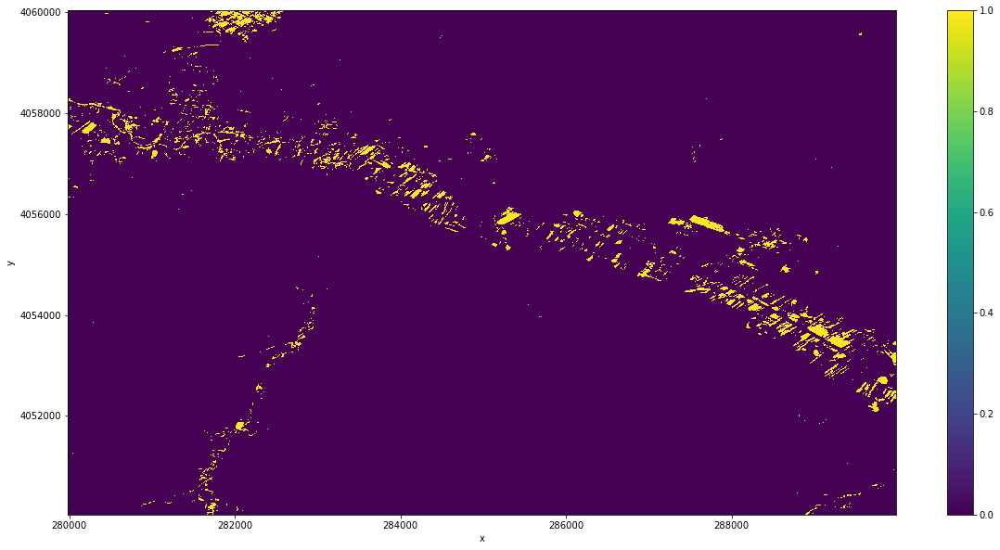

In [72]:
# x > 0.5

mask3 = xr.where(reclass_ndvi==3, 1, 0)
mask3.plot(figsize=(20, 10))

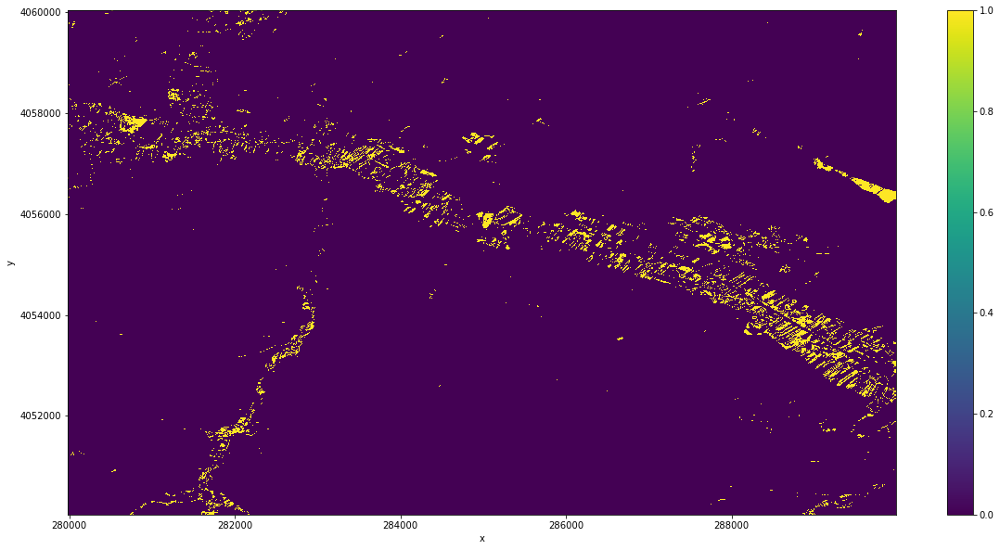

In [12]:
# 0.4 < x < 0.5
mask2 = xr.where(reclass_ndvi==2, 1, 0)
mask2.plot(figsize=(20, 10))

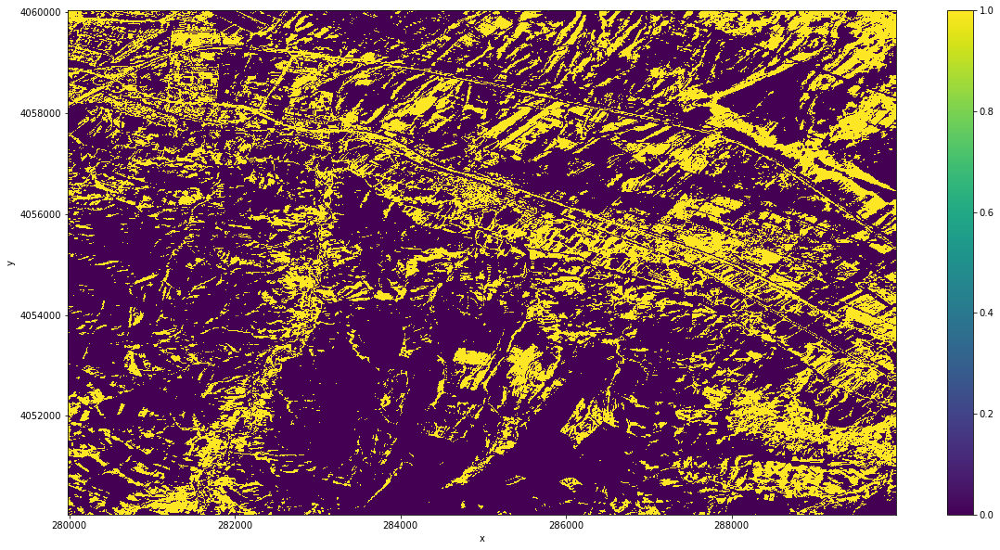

In [73]:
# 0.2 < x < 0.4
mask1 = xr.where(reclass_ndvi==1, 1, 0)
mask1.plot(figsize=(20, 10))


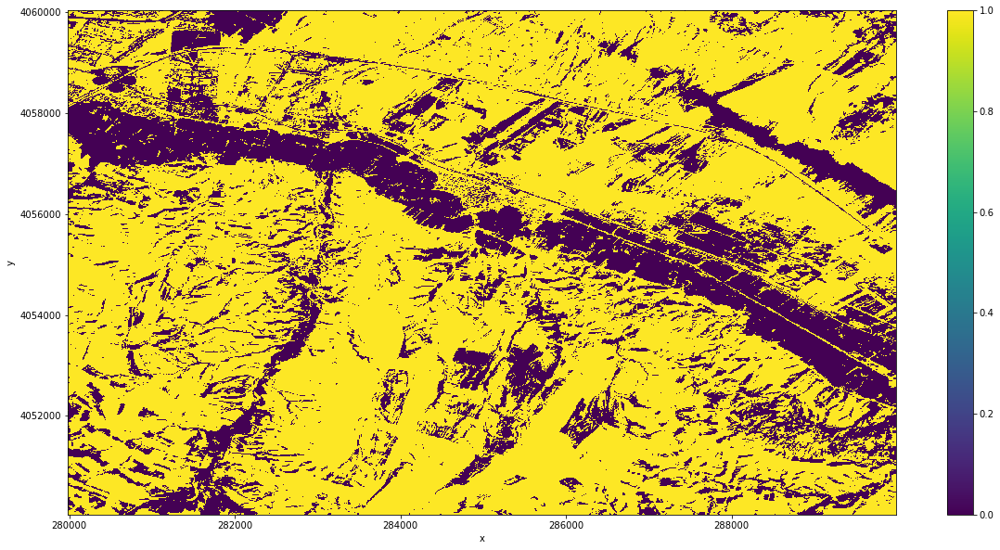

In [14]:
#  x < 0.2
mask0 = xr.where(reclass_ndvi==0, 1, 0)
mask0.plot(figsize=(20, 10))

In [24]:

print("-------Writing to Shapefile-------")
tile_id = config["prep_tile_id"]
out_dir = config["shp_out_dir"]
# file_out_str = config["shp_file_out_str"]
file_out_str = 'after_water'
manual_subset = config["prep_manual_subset"]
x_start = config["prep_x_start"]
y_start = config["prep_y_start"]

### Save to shapefile
# set file paths for output
out_file_name = tile_id + file_out_str + ".shp"
output_str = out_dir + out_file_name


# set parameters for spatial projection and mask
# transform = (10.0, 0.0, 279985.0, 0.0, -10.0, 4020035.0)

transform = ds_time_stack.attrs["transform"]
if manual_subset:
    transform_update = (
        ds_time_stack.attrs["transform"][0],
        ds_time_stack.attrs["transform"][1],
        ds_time_stack.coords["x"].values[0],
        ds_time_stack.attrs["transform"][3],
        ds_time_stack.attrs["transform"][4],
        ds_time_stack.coords["y"].values[0],
    )
    transform = transform_update


    # Update outfile name to reflect spatial subset
    out_file_name = (
        tile_id
        + file_out_str
        + "_x"
        + str(x_start)
        + "_y"
        + str(y_start)
        + "_step"
        + str(config["prep_step"])
        + ".shp"
    )
    output_str = out_dir + out_file_name

# CRS from main data stack attributes
crs = '+init=epsg:32639'
# crs = +init=epsg:32639
# Define mask and set type to bool as required for shapefile writing to work
# mask = mask3.fillna(value=0).astype(bool)
# mask = mask1.astype(bool)
mask = after_water.astype(bool)
# mask = mask.values
# polygonize input raster to GeoJSON-like dictionary with rasterio.features.shapes


import rasterio
from rasterio.features import shapes
# mask = out_raster
with rasterio.Env():
    with reclass_ndvi as src:
        im = reclass_ndvi.values
        image = im # first band
        results = (
        {'properties': {'raster_val': v}, 'geometry': s}
        for i, (s, v) 
        in enumerate(
            shapes(image.astype("int16"), mask=mask, transform=transform,connectivity=8)))
geoms = list(results)

schema_template = {"geometry": "Polygon", "properties": {"raster_val": "int"}}

# src_crs is the coordinate reference system from the source raster that holds the spatial metadata
with fiona.open(
    output_str, "w", driver="Shapefile", schema=schema_template, crs=crs
) as layer:
    # loop through the list of raster polygons and write to the shapefile
    for geom in geoms:
        layer.write(geom)

transform

-------Writing to Shapefile-------


(10.0, 0.0, 279985.0, 0.0, -10.0, 4060035.0)

In [43]:
crs

'+init=epsg:32639'